In [ ]:
from rosbags.rosbag1 import Reader
from rosbags.typesys import Stores, get_typestore, get_types_from_msg
from pathlib import Path
from bps_oculus.core import unpack_data_entry, polar_to_cart
import cv2
import numpy as np

from rosbags.highlevel import AnyReader
from rosbags.typesys import Stores, get_typestore



In [ ]:
# Custom RawData msg definition
msg_text = """
std_msgs/Header header
int8 DATA_OUT=0
int8 DATA_IN=1
int8 direction
uint8[] data
"""
add_types = {}
add_types.update(get_types_from_msg(msg_text, 'apl_msgs/msg/RawData'))

bag_path = Path('blue3_2025-03-19-13-58-48.bag')
typestore = get_typestore(Stores.ROS1_NOETIC)
typestore.register(add_types)

START_TIMESTAMP = 1742392985721249949

In [ ]:
# SIFT setup
sift = cv2.SIFT_create()
bf_matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# initialize previous frame variables
prev_gray = None
prev_kp = None
prev_des = None
prev_pts = None
feature_id_counter = 0
feature_tracks = {}  # key: feature_id -> list of (x, y)
active_features = {}  # key: current_frame_pt (rounded) -> feature_id


cumulative_transform = np.eye(3)
trajectory = []  # to log x, y positions over time


In [ ]:
# Read rosbag data
with Reader(bag_path) as reader:
    for connection, timestamp, rawdata in reader.messages():
        if timestamp < START_TIMESTAMP:
            continue
        if connection.topic != '/oculus/raw_data':
            continue

        msg = typestore.deserialize_ros1(rawdata, connection.msgtype)
        _, polar_image_data, _ = unpack_data_entry(msg.data.tobytes())
        if polar_image_data is None:
            continue

        # Sonar data preprocessing
        img = polar_to_cart(polar_image_data).cart_image
        img_uint8 = np.uint8(img / img.max() * 255)
        img_gray = cv2.equalizeHist(cv2.GaussianBlur(img_uint8, (5, 5), 0))
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img_clahe = clahe.apply(img_uint8)
        img_color = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)

        # SIFT feature detection and matching
        kp, des = sift.detectAndCompute(img_clahe, None)

        # Match features with previous frame
        if prev_gray is not None and prev_des is not None and len(kp) > 0 and len(prev_kp) > 0:
            matches = bf_matcher.match(prev_des, des)
            matches = sorted(matches, key=lambda x: x.distance)

            # Filter matches based on distance
            max_pixel_distance = 40  # adjust this based on resolution & empirical testing
            good_matches = []
            new_active_features = {}

            for m in matches:
                pt1 = tuple(np.round(prev_kp[m.queryIdx].pt).astype(int))
                pt2 = tuple(np.round(kp[m.trainIdx].pt).astype(int))
                dist = np.linalg.norm(np.array(pt1) - np.array(pt2))
                if dist < max_pixel_distance:
                    good_matches.append((m, pt1, pt2))


            if len(good_matches) >= 5:
                pts1 = np.float32([gm[1] for gm in good_matches]).reshape(-1, 1, 2)
                pts2 = np.float32([gm[2] for gm in good_matches]).reshape(-1, 1, 2)

                M, inliers = cv2.estimateAffinePartial2D(pts1, pts2, method=cv2.RANSAC)
                if M is not None:
                    # Convert to 3x3 homogeneous matrix
                    motion = np.eye(3)
                    motion[:2, :] = M
                    cumulative_transform = cumulative_transform @ motion

                    # Extract x, y translation (you could also extract yaw if needed)
                    x, y = cumulative_transform[0, 2], cumulative_transform[1, 2]
                    trajectory.append((x, y))


            for m, pt1, pt2 in good_matches:
                # Check if the feature in the previous frame has an ID
                fid = active_features.get(pt1)

                # untracked feature --> New id
                if fid is None:
                    fid = feature_id_counter
                    feature_id_counter += 1
                    feature_tracks[fid] = [pt1]

                # Update the feature ID for the new point
                feature_tracks[fid].append(pt2)
                new_active_features[pt2] = fid

                cv2.circle(img_color, pt2, 3, (0, 255, 0), -1)
                cv2.line(img_color, pt1, pt2, (255, 0, 0), 1)

            active_features = new_active_features

            # # DRaw matches
            # for m in good_matches[:50]:  # Limit to best 50 matches for clarity
            #     pt1 = tuple(np.round(prev_kp[m.queryIdx].pt).astype(int))
            #     pt2 = tuple(np.round(kp[m.trainIdx].pt).astype(int))
            #     cv2.circle(img_color, pt2, 3, (0, 255, 0), -1)
            #     cv2.line(img_color, pt1, pt2, (255, 0, 0), 1)
        
        prev_gray = img_gray
        prev_kp = kp
        prev_des = des
        
        # Dipslay sonar data with SIFT features
        FRAME_RATE = 1000
        FRAME_DELAY = int(1000 / FRAME_RATE)
        cv2.namedWindow("SIFT Feature Tracking", cv2.WINDOW_NORMAL)
        cv2.imshow("SIFT Feature Tracking", img_color)
        
        if cv2.waitKey(FRAME_DELAY) & 0xFF == ord('q'):
            break

cv2.destroyAllWindows()

# Print top persistent features
print("\nTop persistent features:")
persistent = sorted(feature_tracks.items(), key=lambda x: -len(x[1]))
for fid, pts in persistent[:10]:
    print(f"Feature {fid} seen in {len(pts)} frames")

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is not the object's thread (0x3e73ecf0).
Cannot move to target thread (0x3e276b10)

QObject::moveToThread: Current thread (0x3e276b10) is n


Top persistent features:
Feature 2191 seen in 142 frames
Feature 83791 seen in 102 frames
Feature 213582 seen in 86 frames
Feature 103077 seen in 77 frames
Feature 105141 seen in 69 frames
Feature 65214 seen in 68 frames
Feature 35779 seen in 66 frames
Feature 120864 seen in 66 frames
Feature 85289 seen in 64 frames
Feature 87807 seen in 57 frames


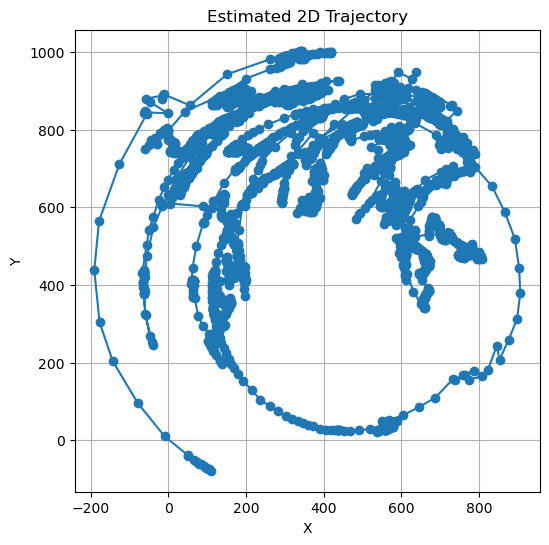

In [ ]:
import matplotlib.pyplot as plt

trajectory_np = np.array(trajectory)
plt.figure(figsize=(6,6))
plt.plot(trajectory_np[:, 0], trajectory_np[:, 1], marker='o')
plt.title("Estimated 2D Trajectory")
plt.xlabel("X")
plt.ylabel("Y")
plt.axis('equal')
plt.grid(True)
plt.show()


In [ ]:
print("\nAll features:")
for fid, pts in feature_tracks.items():
    print(f"Feature {fid} seen in {len(pts)} frames")

# print("\nActive features:")
# for pt, fid in active_features.items():
#     print(f"Feature {fid} at {pt}")


All features:
Feature 0 seen in 2 frames
Feature 1 seen in 2 frames
Feature 2 seen in 14 frames
Feature 3 seen in 2 frames
Feature 4 seen in 13 frames
Feature 5 seen in 2 frames
Feature 6 seen in 6 frames
Feature 7 seen in 4 frames
Feature 8 seen in 8 frames
Feature 9 seen in 2 frames
Feature 10 seen in 6 frames
Feature 11 seen in 5 frames
Feature 12 seen in 2 frames
Feature 13 seen in 2 frames
Feature 14 seen in 2 frames
Feature 15 seen in 2 frames
Feature 16 seen in 2 frames
Feature 17 seen in 2 frames
Feature 18 seen in 2 frames
Feature 19 seen in 2 frames
Feature 20 seen in 4 frames
Feature 21 seen in 2 frames
Feature 22 seen in 2 frames
Feature 23 seen in 3 frames
Feature 24 seen in 2 frames
Feature 25 seen in 4 frames
Feature 26 seen in 2 frames
Feature 27 seen in 2 frames
Feature 28 seen in 2 frames
Feature 29 seen in 2 frames
Feature 30 seen in 2 frames
Feature 31 seen in 2 frames
Feature 32 seen in 2 frames
Feature 33 seen in 3 frames
Feature 34 seen in 2 frames
Feature 35 se

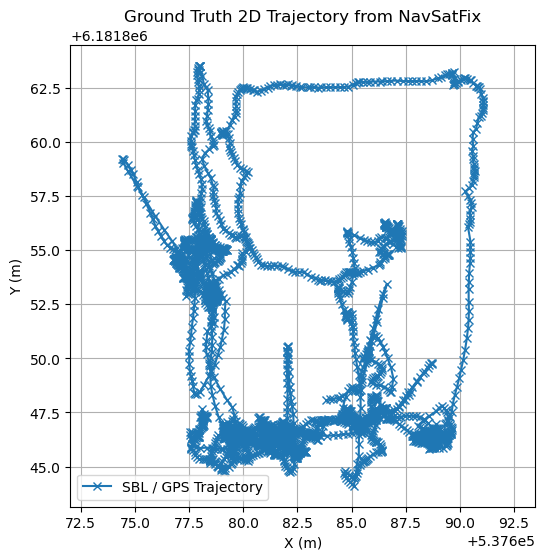

In [ ]:
from pyproj import Proj, Transformer
import matplotlib.pyplot as plt

gps_x, gps_y = [], []

# Transformer: WGS84 lat/lon --> UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:2197", always_xy=True)

with AnyReader([bag_path], default_typestore=typestore) as reader:
    connections = [x for x in reader.connections if x.topic == '/bluerov2/mavros/global_position/global']
    for connection, timestamp, rawdata in reader.messages(connections=connections):
        msg = reader.deserialize(rawdata, connection.msgtype)
        lon, lat = msg.longitude, msg.latitude

        x, y = transformer.transform(lon, lat)
        gps_x.append(x)
        gps_y.append(y)

# Plot GPS-based trajectory
plt.figure(figsize=(6, 6))
plt.plot(gps_x, gps_y, marker='x', label="SBL / GPS Trajectory")
plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.axis('equal')
plt.grid(True)
plt.legend()
plt.title("Ground Truth 2D Trajectory from NavSatFix")
plt.show()
